## **Part 1 - Detect objects in unseen image using pre-trained YOLOv8 model**

## **Test object detection from unseen image**

Download unseen image:

In [2]:
!gdown "https://drive.google.com/uc?id=1q1UStMzqH0p9a9OiYKhEb95FCNqL1Fny&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1q1UStMzqH0p9a9OiYKhEb95FCNqL1Fny&confirm=t
To: /content/image-test-1.jpg
100% 3.99M/3.99M [00:00<00:00, 220MB/s]


**Install YOLO**

In [3]:
!pip install -U ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.7 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

**Predict objects on downloaded image**

In [3]:
from ultralytics import YOLO

# Load a YOLOv8 model
model = YOLO('yolov8m.pt')
results = model(source='/content/image-test-1.jpg', conf=0.25,save=True)


image 1/1 /content/image-test-1.jpg: 640x640 2 persons, 2 bicycles, 8 cars, 37.4ms
Speed: 4.5ms preprocess, 37.4ms inference, 665.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict3


**Show result of prediction:**

In [4]:
from IPython.display import Image

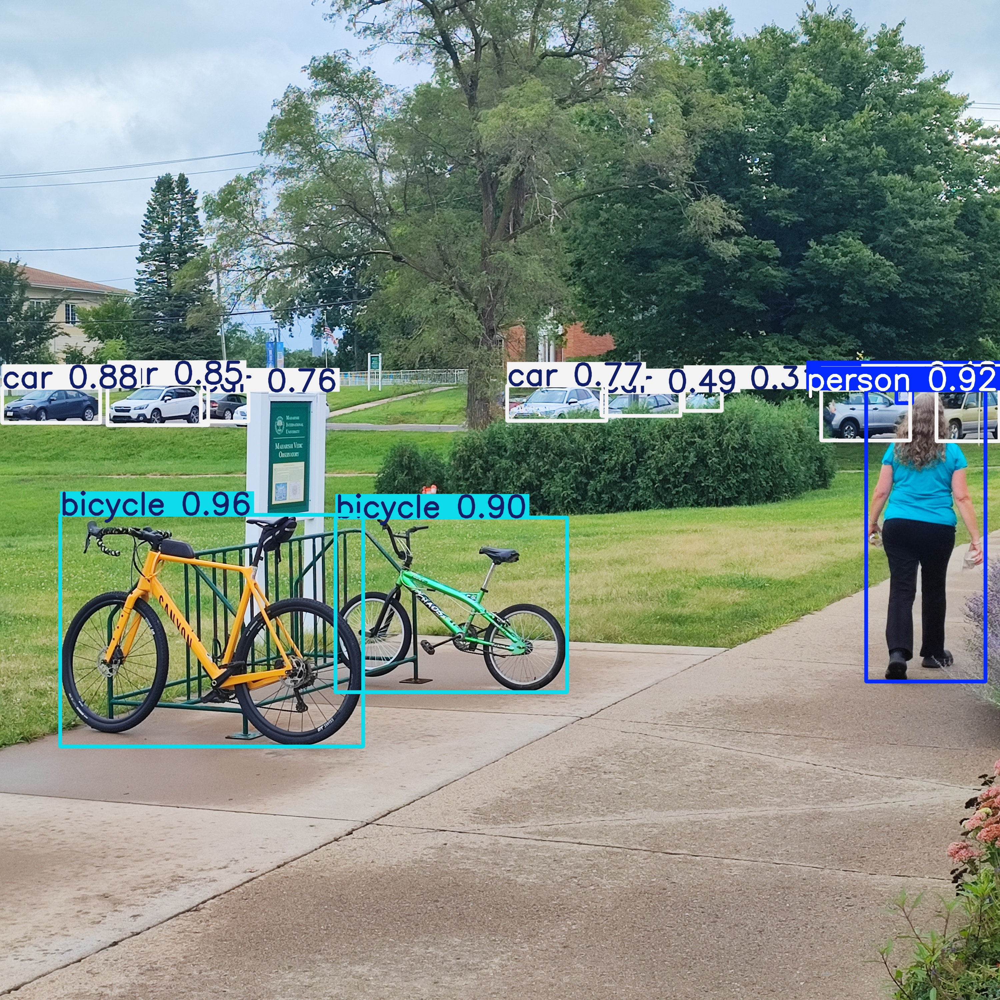

In [5]:
Image('/content/runs/detect/predict3/image-test-1.jpg')

## **Part 2 - Knowledge transfering - Re-train YOLOv8 model on custom specific data as Fire dataset**


## **Download dataset from Roboflow Universe**



In [4]:
!pip install -q roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.6 MB/s eta 0:00:00


In [5]:
from roboflow import Roboflow
rf = Roboflow(api_key="FgeehcxWkzz94oos3m3L")
project = rf.workspace("rehman-2vlay").project("fire-detection-vdtmc")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.77, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Fire-Detection-1 in yolov8:: 100%|██████████| 1514/1514 [00:00<00:00, 6747.10it/s]


## **Custom Training**

In [22]:
from ultralytics import YOLO

model = YOLO("yolov8m.pt")

results = model.train(data="/content/Fire-Detection-1/data.yaml", epochs=50, plots=True)

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/Fire-Detection-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train14, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=

train: Scanning /content/Fire-Detection-1/train/labels.cache... 525 images, 0 backgrounds, 0 corrupt: 100%|██████████| 525/525 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/Fire-Detection-1/valid/labels.cache... 149 images, 0 backgrounds, 0 corrupt: 100%|██████████| 149/149 [00:00<?, ?it/s]


Plotting labels to runs/detect/train14/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train14
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.45G     0.7735      1.592      1.113         41        640: 100%|██████████| 33/33 [00:16<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.39it/s]

                   all        149        287      0.475      0.498       0.37      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      7.85G     0.7184     0.9101      1.065         28        640: 100%|██████████| 33/33 [00:16<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        149        287    0.00266      0.174    0.00119   0.000342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.86G     0.7226     0.9003      1.069         27        640: 100%|██████████| 33/33 [00:16<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287    0.00337      0.254    0.00204   0.000483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.96G     0.6988     0.8499      1.047         40        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287     0.0119     0.0941     0.0048    0.00118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.85G     0.6644     0.7349      1.023         35        640: 100%|██████████| 33/33 [00:15<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  2.50it/s]

                   all        149        287      0.127      0.303     0.0641      0.038



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      7.96G     0.6249     0.6617      1.025         39        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.43it/s]

                   all        149        287      0.654      0.652       0.64       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.96G     0.5756      0.595     0.9651         38        640: 100%|██████████| 33/33 [00:16<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        149        287        0.9      0.774      0.883      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.95G     0.5685     0.6007     0.9706         46        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        149        287      0.938      0.903      0.963      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.89G     0.5385     0.5708     0.9593         43        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.941      0.897      0.953      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      7.95G     0.5132     0.5318     0.9371         32        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        149        287      0.946      0.895      0.948       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.96G     0.4788     0.4879     0.9355         31        640: 100%|██████████| 33/33 [00:16<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.974      0.917      0.974       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.94G     0.4849     0.4954     0.9229         38        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.894      0.849      0.923      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      7.88G     0.4447     0.4657     0.9216         38        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.943      0.929      0.971       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.96G     0.4413     0.4609     0.9111         27        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287       0.99      0.944      0.975      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.96G     0.4223     0.4393     0.9048         38        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        149        287      0.947       0.93      0.966      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.99G     0.3999     0.4435     0.9048         35        640: 100%|██████████| 33/33 [00:16<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.975      0.941      0.976      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.86G     0.3983     0.4176     0.9109         32        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.938      0.948      0.973      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      7.98G     0.4155     0.4494     0.9005         43        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.931      0.951       0.97      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      7.96G     0.4026     0.4144     0.8972         26        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.976      0.944      0.973      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.95G     0.3904     0.4163     0.8932         37        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        149        287      0.978      0.962      0.974      0.894



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      7.86G     0.3858     0.4057     0.8823         51        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.948      0.954       0.98      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.97G     0.3763     0.4021     0.8867         39        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.979      0.923      0.971      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.97G     0.3752     0.3807      0.883         49        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        149        287      0.967      0.955       0.98      0.901



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.95G     0.3734     0.3999     0.8835         47        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.982      0.937       0.98       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.85G     0.3687     0.3787      0.884         34        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.955      0.951      0.979      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.98G     0.3333     0.3458     0.8693         35        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.965      0.958      0.981      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      7.98G     0.3645     0.3669     0.8725         36        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.978      0.944      0.981      0.916



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      7.94G     0.3349     0.3605     0.8739         38        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        149        287      0.978      0.955      0.982      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.85G     0.3244     0.3426     0.8662         40        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.44it/s]

                   all        149        287      0.985      0.934      0.969      0.903



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.98G     0.3349     0.3459     0.8712         49        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.975      0.937      0.978      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      7.94G     0.3333     0.3535     0.8735         27        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.988      0.941      0.983      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.95G     0.3114     0.3181     0.8682         33        640: 100%|██████████| 33/33 [00:16<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.974      0.962      0.981      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      7.87G     0.3056       0.31     0.8607         33        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.978      0.951      0.983      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.97G     0.2855     0.3015     0.8703         45        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        149        287      0.978      0.949      0.983      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      7.95G     0.2864     0.2914     0.8535         39        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.982      0.955      0.991      0.938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      7.95G     0.2823     0.3007     0.8602         27        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.972      0.964      0.989      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.87G     0.2935     0.3026     0.8612         42        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.45it/s]

                   all        149        287       0.99      0.958      0.987      0.937



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.97G     0.2865     0.2916     0.8592         50        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.993      0.944      0.982      0.935



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.95G     0.2705     0.2837     0.8547         28        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.986      0.965      0.986      0.941



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.96G     0.2708     0.2785     0.8582         41        640: 100%|██████████| 33/33 [00:15<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.969      0.965       0.98      0.941


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.86G     0.2573     0.2456     0.8257         20        640: 100%|██████████| 33/33 [00:16<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.983      0.965      0.985      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.98G     0.2547     0.2254     0.8214         18        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.986      0.965      0.989      0.948



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.96G     0.2547     0.2322     0.8181         22        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.986      0.961      0.986      0.945



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.95G     0.2513     0.2298     0.8251         19        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287      0.985      0.955      0.985      0.943



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.86G     0.2468     0.2282     0.8246         15        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.50it/s]

                   all        149        287      0.975       0.96      0.985      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.96G     0.2421     0.2116     0.8285         18        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.46it/s]

                   all        149        287      0.996      0.957       0.99      0.947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.96G     0.2321      0.208       0.82         20        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.47it/s]

                   all        149        287      0.994      0.958      0.991      0.951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.94G     0.2313     0.2007     0.8189         20        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287      0.993      0.962       0.99       0.95



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.85G     0.2176     0.1927     0.8134         27        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.49it/s]

                   all        149        287       0.99      0.958       0.99      0.951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.95G     0.2163     0.1897     0.8198         22        640: 100%|██████████| 33/33 [00:15<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  2.48it/s]

                   all        149        287       0.99      0.958       0.99      0.952



50 epochs completed in 0.269 hours.
Optimizer stripped from runs/detect/train14/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train14/weights/best.pt, 52.0MB

Validating runs/detect/train14/weights/best.pt...
Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.29it/s]


                   all        149        287       0.99      0.958       0.99      0.952
Speed: 0.2ms preprocess, 9.9ms inference, 0.0ms loss, 9.1ms postprocess per image
Results saved to runs/detect/train14


#**Display the confusion matrix and Results**

In [23]:
from IPython.display import Image

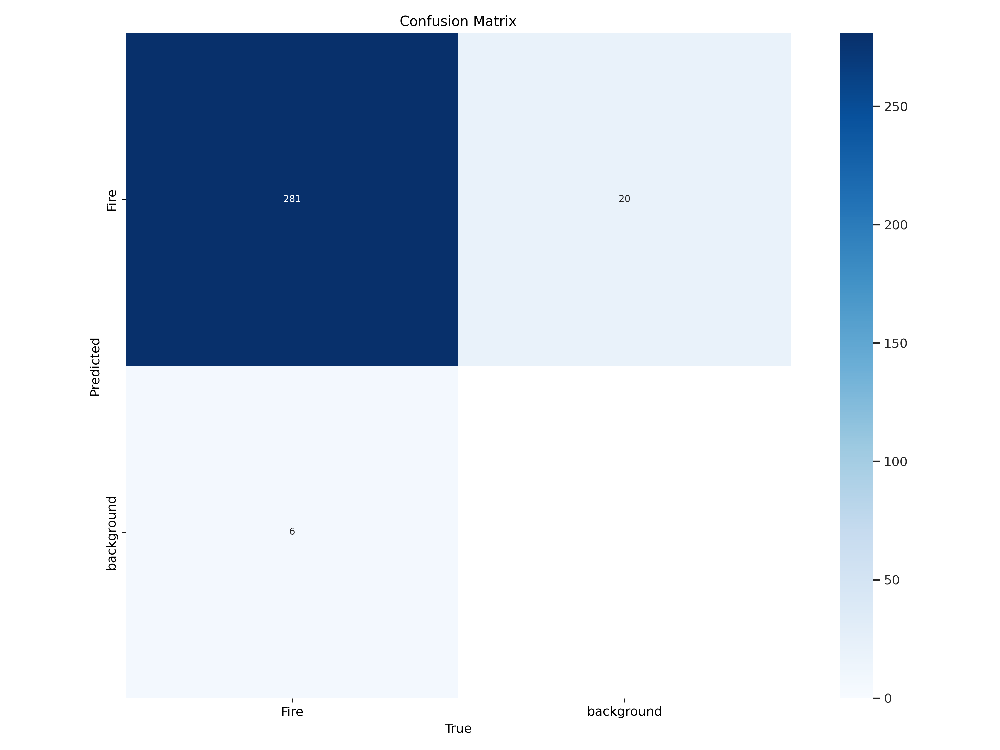

In [24]:
Image(filename='/content/runs/detect/train14/confusion_matrix.png', width=600)

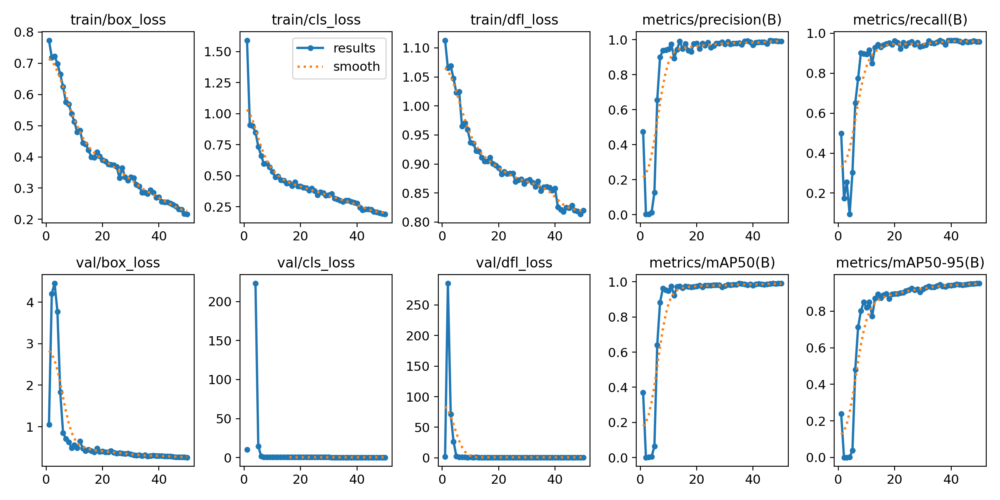

In [25]:
Image(filename='/content/runs/detect/train14/results.png', width=600)

# **Testing the Trained Model**

In [26]:
model_path = '/content/runs/detect/train14/weights/best.pt'
model = YOLO(model_path)
results = model(source='/content/Fire-Detection-1/test/images', conf=0.25,save=True)



image 1/77 /content/Fire-Detection-1/test/images/large_-1052-_jpg.rf.5e87fdb7cf79d7b9fe38a662f0edfce1.jpg: 640x640 3 Fires, 37.1ms
image 2/77 /content/Fire-Detection-1/test/images/large_-1189-_jpg.rf.29f5c9be9e563bdd1eaba27e93392b8f.jpg: 640x640 1 Fire, 34.9ms
image 3/77 /content/Fire-Detection-1/test/images/large_-1194-_jpg.rf.1ceb7a90b4aa9e5ea3d50f7a9eb1ede1.jpg: 640x640 2 Fires, 34.0ms
image 4/77 /content/Fire-Detection-1/test/images/large_-1324-_jpg.rf.39c6dd2653ebb9e519c6f65b0e35fc27.jpg: 640x640 1 Fire, 34.0ms
image 5/77 /content/Fire-Detection-1/test/images/large_-1399-_jpg.rf.fc0d34273b4f8258ba93f2d5d70f270c.jpg: 640x640 4 Fires, 34.0ms
image 6/77 /content/Fire-Detection-1/test/images/large_-1510-_jpg.rf.a6bfaed4330373880c0bf337ec92d138.jpg: 640x640 1 Fire, 22.5ms
image 7/77 /content/Fire-Detection-1/test/images/large_-1654-_jpg.rf.b7273711304929e9be921d92e0c9c5d9.jpg: 640x640 2 Fires, 22.6ms
image 8/77 /content/Fire-Detection-1/test/images/large_-1659-_jpg.rf.eaad6ee3b632cc52

**Display all predicted images:**

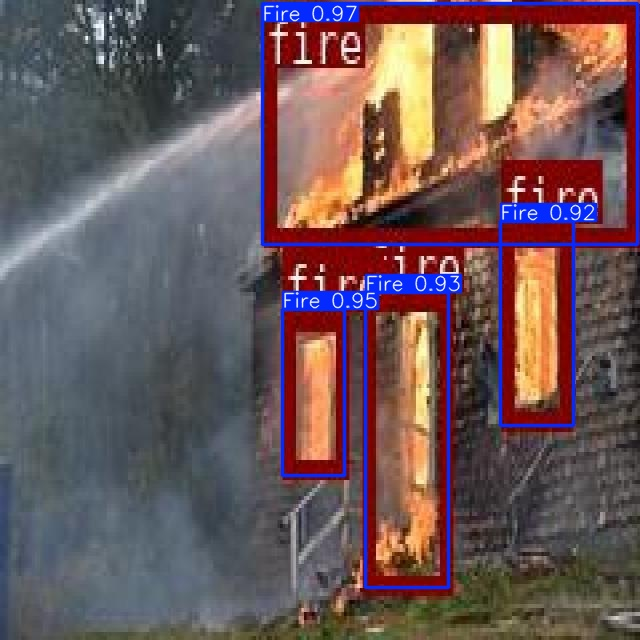

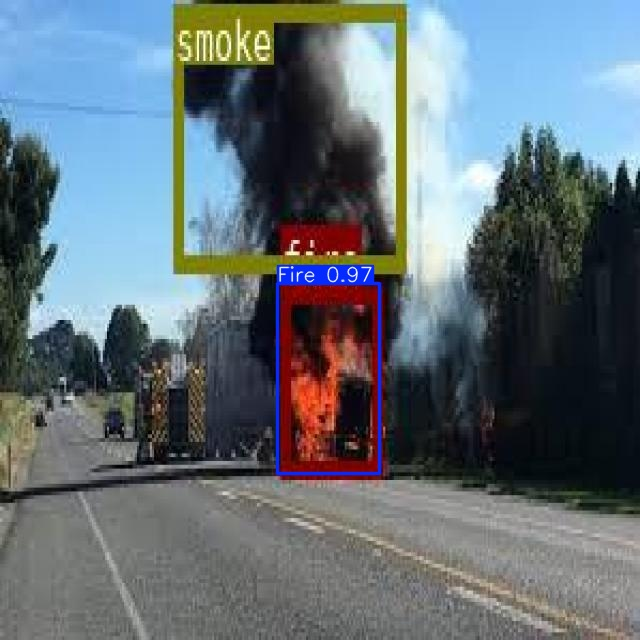

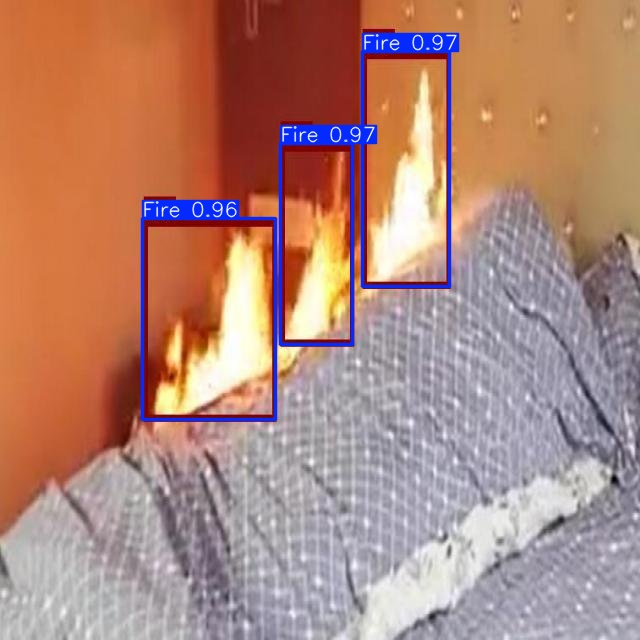

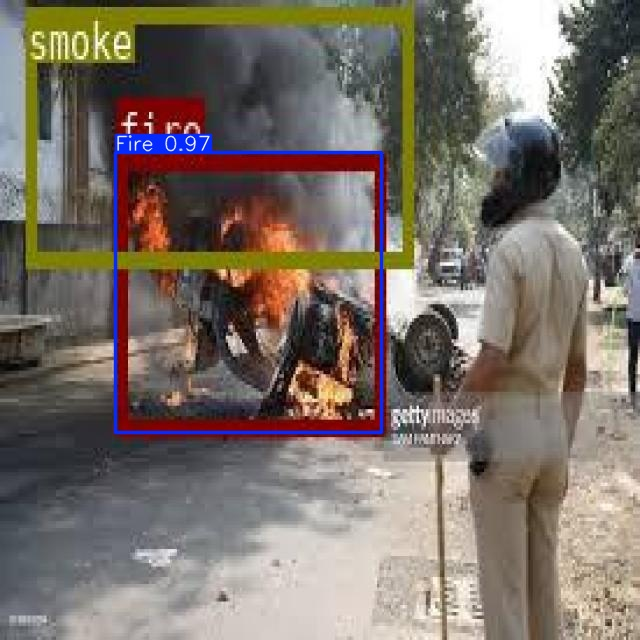

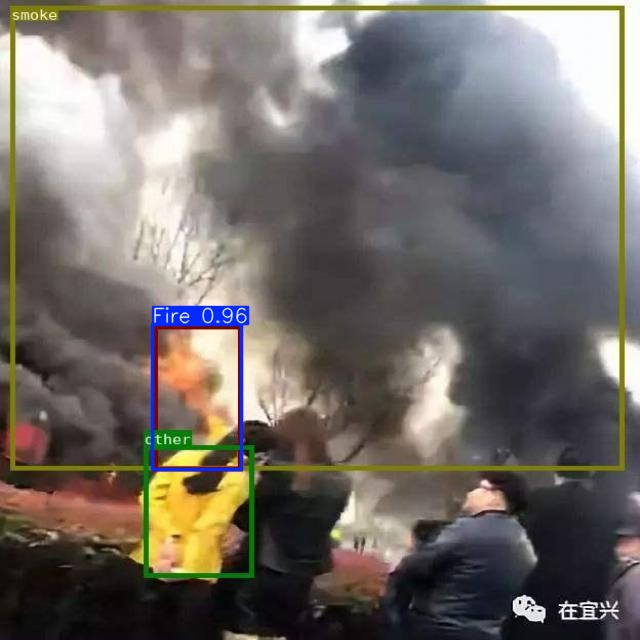

...

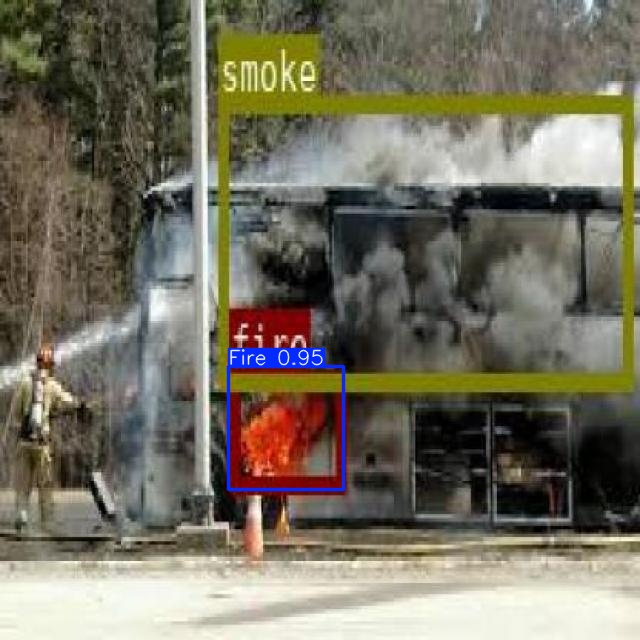

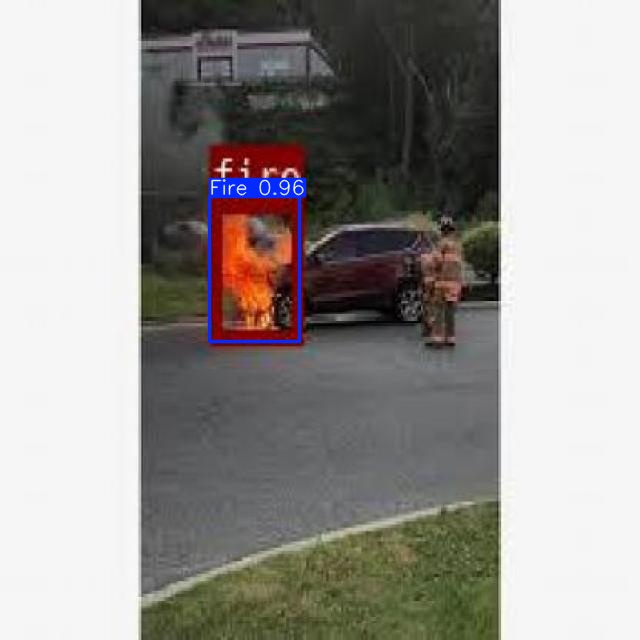

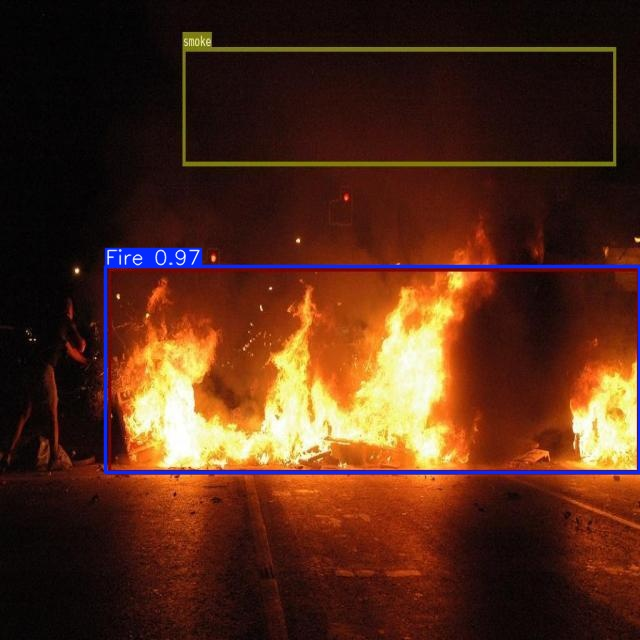

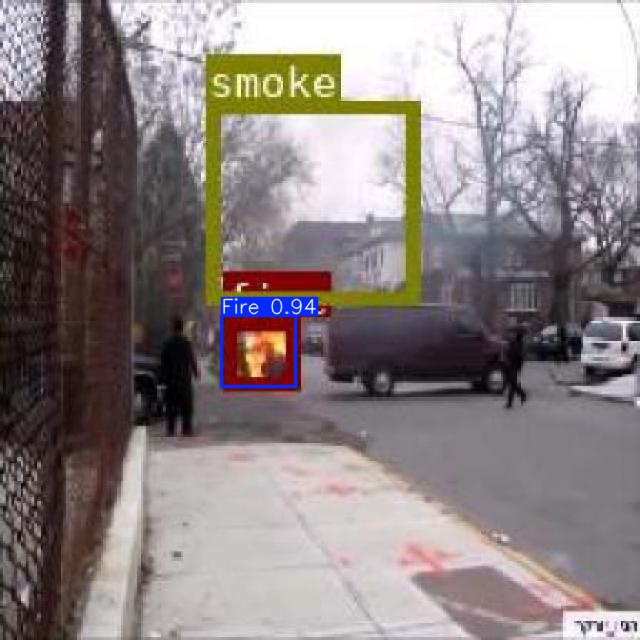

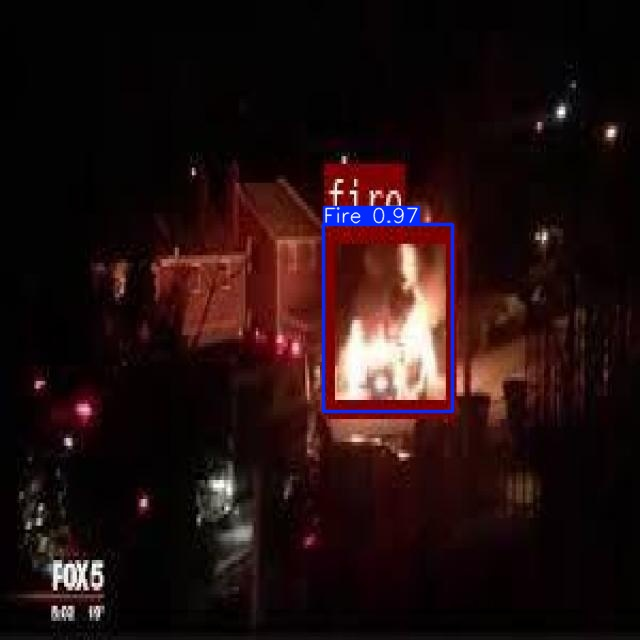

In [27]:
import glob
images = glob.glob('/content/runs/detect/predict4/*.jpg')
for image in images:
  display(Image(filename = image,width=400))

**Testing trained model on never seen images before:**

In [28]:
model_path = '/content/runs/detect/train14/weights/best.pt'
model = YOLO(model_path)
results = model(source='/content/Test-data-fire', conf=0.25,save=True)



image 1/13 /content/Test-data-fire/000001.jpg: 448x640 1 Fire, 100.3ms
image 2/13 /content/Test-data-fire/000002.jpg: 384x640 (no detections), 88.9ms
image 3/13 /content/Test-data-fire/000030.jpg: 256x640 1 Fire, 79.3ms
image 4/13 /content/Test-data-fire/000036.jpg: 480x640 1 Fire, 73.3ms
image 5/13 /content/Test-data-fire/000070.jpg: 640x480 1 Fire, 63.0ms
image 6/13 /content/Test-data-fire/000099.jpg: 480x640 1 Fire, 28.8ms
image 7/13 /content/Test-data-fire/000110.jpg: 640x640 1 Fire, 37.8ms
image 8/13 /content/Test-data-fire/000116.jpg: 640x448 (no detections), 76.9ms
image 9/13 /content/Test-data-fire/000143.jpg: 640x448 (no detections), 24.2ms
image 10/13 /content/Test-data-fire/000265.jpg: 480x640 (no detections), 25.6ms
image 11/13 /content/Test-data-fire/000388.jpg: 640x640 1 Fire, 33.7ms
image 12/13 /content/Test-data-fire/000443.jpg: 416x640 (no detections), 74.6ms
image 13/13 /content/Test-data-fire/000454.jpg: 480x640 1 Fire, 22.7ms
Speed: 1.9ms preprocess, 56.1ms inferen

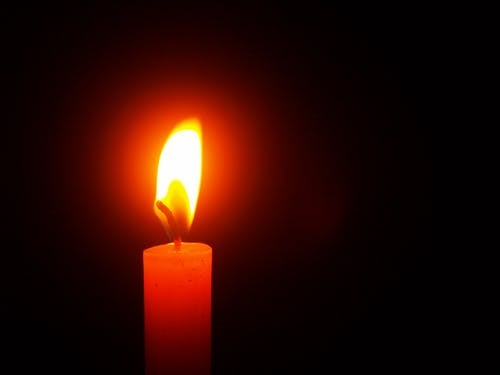

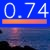

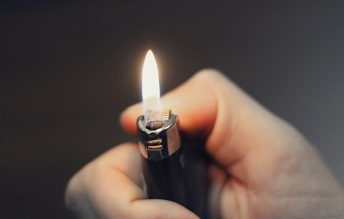

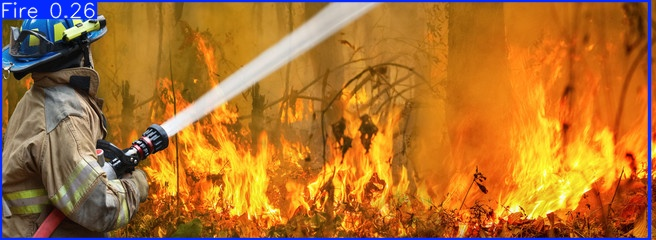

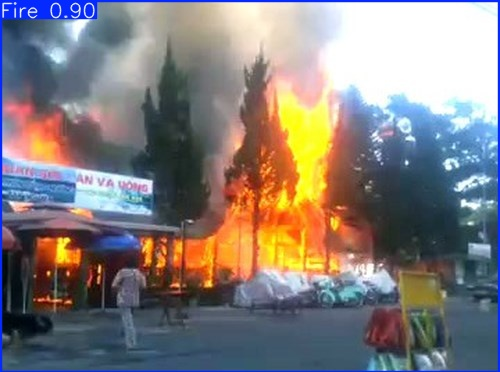

...

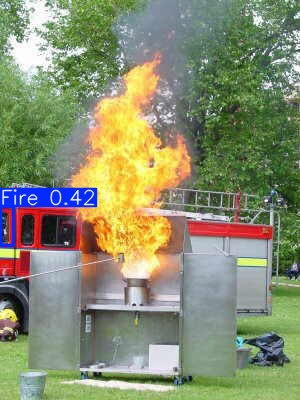

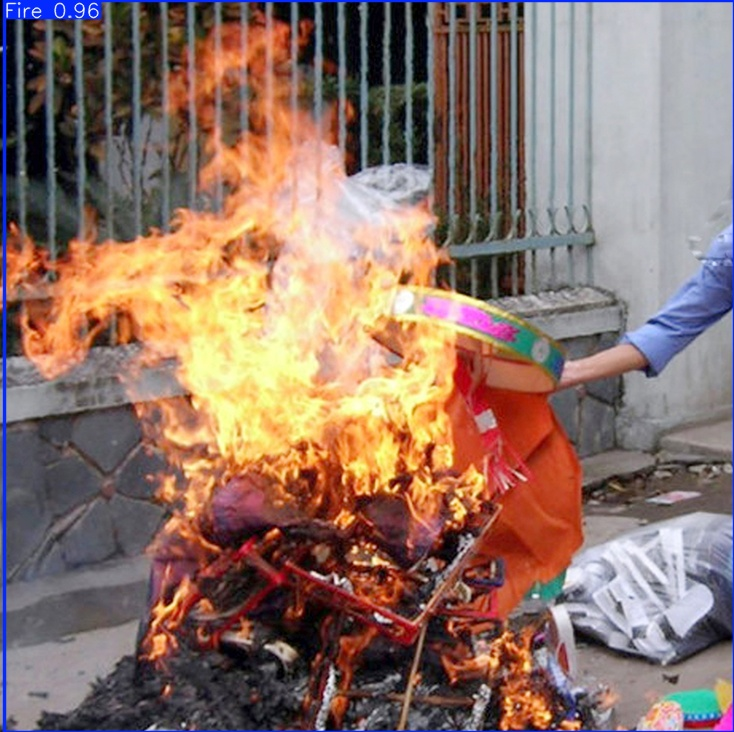

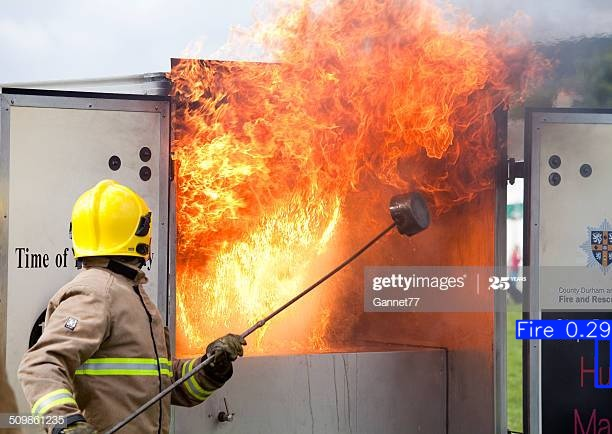

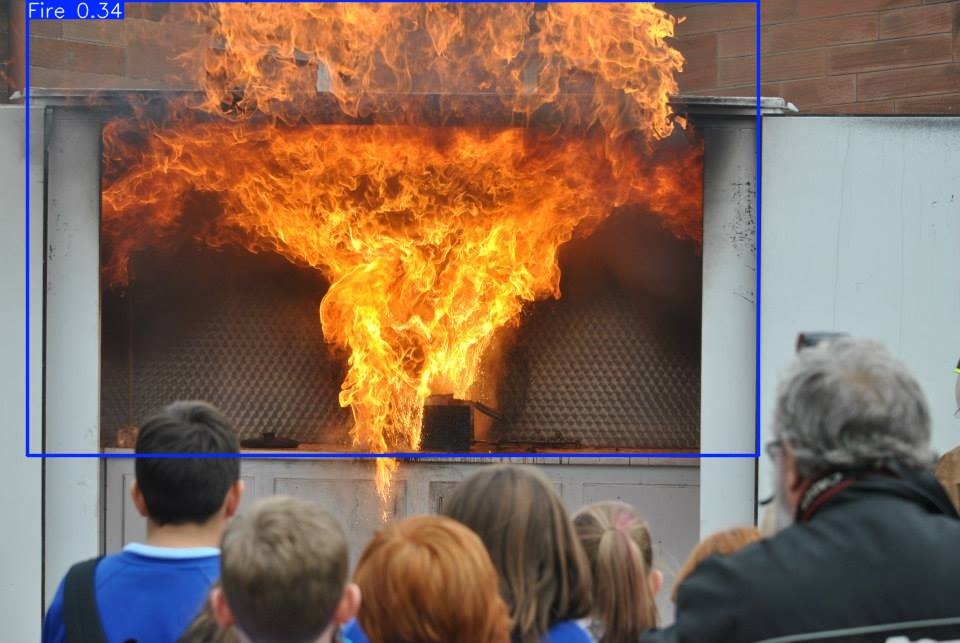

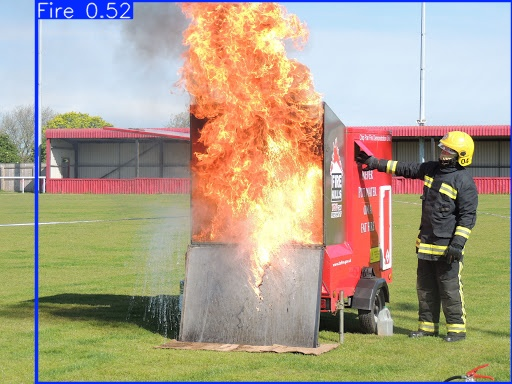

In [29]:
import glob
images = glob.glob('/content/runs/detect/predict5/*.jpg')
for image in images:
  display(Image(filename = image,width=400))